In [ ]:
# importing required libraries.
import numpy as np
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
import pickle
from sklearn.svm import SVC
import seaborn as sns
import requests
import pandas as pd
import requests

In [ ]:
#google colab drive mount code

from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
# creating copy of trained dataset.
# Data Read



real_news = pd.read_csv('/content/gdrive/My Drive/Fake News/Model/Data/True.csv')
fake_news = pd.read_csv('/content/gdrive/My Drive/Fake News/Model/Data/Fake.csv')

# Getting the data having politics as subject

real_news1=real_news[real_news['subject']=='politicsNews']
fake_news1=fake_news[fake_news['subject'].isin(['politics','Government News', 'US_News'])].reset_index(drop=True)




In [ ]:
fake_news1.subject.value_counts(), real_news1.subject.value_counts()

(politics           6841
 Government News    1570
 US_News             783
 Name: subject, dtype: int64, politicsNews    11272
 Name: subject, dtype: int64)

In [ ]:
# checking if there is empty rows in real news
empty_real_index = [index for index,text in enumerate(real_news1.text.values) if str(text).strip() == '']
print(f"No of empty rows: {len(empty_real_index)}")
real_news1.iloc[empty_real_index].tail()

No of empty rows: 1


,title,text,subject,date
8970,Graphic: Supreme Court roundup,,politicsNews,"June 16, 2016"


In [ ]:
# checking for the same in fake news
empty_fake_index = [index for index,text in enumerate(fake_news1.text.values) if str(text).strip() == '']
print(f"No of empty rows: {len(empty_fake_index)}")
fake_news1.iloc[empty_fake_index].tail()

No of empty rows: 480


,title,text,subject,date
8312,(VIDEO)MILWAUKEE SHERIFF DAVID CLARKE HAMMERS ...,,Government News,"May 8, 2015"
8323,BLACK REPUBLICAN AND BRILLIANT NEUROSURGEON AN...,,Government News,"May 5, 2015"
8325,(VIDEO)INCREDIBLE ACCOUNT FROM SHERIFF MICHAEL...,,Government News,"May 4, 2015"
8337,(VIDEO) RIOTERS TAKE SELFIES WITH TORCHED POLI...,,Government News,"Apr 27, 2015"
8368,TREY GOWDY TO DEA CHIEF ON MISCONDUCT: “WHAT T...,,Government News,"Apr 14, 2015"


In [ ]:
# since it is only one row we can remove it
# dropping this row in real set
real_news1 = real_news1.drop(8970, axis=0)

In [ ]:
empty_real_index = [index for index,text in enumerate(real_news1.text.values) if str(text).strip() == '']
print(f"No of empty rows: {len(empty_real_index)}")
real_news1.iloc[empty_real_index].tail()

No of empty rows: 0


,title,text,subject,date


In [ ]:
# Get the substring in pandas 
# getting a the source from each text 
real_news1['source'] =real_news1.text.str.slice(10, 20)
print(real_news1)

                                                   title  \
0      As U.S. budget fight looms, Republicans flip t...   
1      U.S. military to accept transgender recruits o...   
2      Senior U.S. Republican senator: 'Let Mr. Muell...   
3      FBI Russia probe helped by Australian diplomat...   
4      Trump wants Postal Service to charge 'much mor...   
5      White House, Congress prepare for talks on spe...   
6      Trump says Russia probe will be fair, but time...   
7      Factbox: Trump on Twitter (Dec 29) - Approval ...   
8             Trump on Twitter (Dec 28) - Global Warming   
9      Alabama official to certify Senator-elect Jone...   
10     Jones certified U.S. Senate winner despite Moo...   
11     New York governor questions the constitutional...   
12     Factbox: Trump on Twitter (Dec 28) - Vanity Fa...   
13        Trump on Twitter (Dec 27) - Trump, Iraq, Syria   
14     Man says he delivered manure to Mnuchin to pro...   
15     Virginia officials postpone lotte

In [ ]:
#creating label for fake and real news
real_news1['label']=1
fake_news1['label']=0

In [ ]:
#Appending the two dataframe
news_df_copy = real_news1.append(fake_news1, ignore_index=True)

In [ ]:
news_df_copy.head()

,title,text,subject,date,source,label
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",(Reuters),1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",(Reuters),1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",(Reuters),1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",(Reuters),1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",SHINGTON (,1


In [ ]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(news_df_copy, test_size=0.2)


In [ ]:
news_df_train = train

In [ ]:
news_df_train.head()

,title,text,subject,date,source,label
11949,TRUMP BLASTS SENATE RINO ON TWITTER…Exposes RE...,President Trump just exposed one of the bigges...,politics,"Oct 8, 2017",NaN,0
2737,U.S. health insurers want Cruz proposal droppe...,WASHINGTON (Reuters) - Two major U.S. health i...,politicsNews,"July 15, 2017",(Reuters),1
11234,Ted Cruz did not disclose 2012 Senate campaign...,(Reuters) - Republican presidential candidate ...,politicsNews,"January 14, 2016",- Republic,1
19655,(VIDEO) OBAMA THROWS AMERICA UNDER THE BUS…AGAIN,I am a student of history so I tend to actual...,Government News,"Apr 12, 2015",NaN,0
6523,Exclusive: Trump team seeks agency records on ...,WASHINGTON (Reuters) - In a wide-ranging requ...,politicsNews,"January 3, 2017",N (Reuters,1


In [ ]:
news_df_test = test

In [ ]:
news_df_test.head()

,title,text,subject,date,source,label
20277,Oliver Stone: Pokémon Go is ‘Surveillance Capi...,Press Association The GuardianFilm director O...,US_News,"July 22, 2016",NaN,0
15250,BREAKING: OBAMA WILL VETO BILL Unanimously Pas...,This should come as a surprise to no one Yeste...,politics,"Sep 12, 2016",NaN,0
12262,The Real Reason Trump is Angry With McConnell ...,Undercutting President Trump s agenda is what ...,politics,"Aug 26, 2017",NaN,0
1693,CBO says won't specify insurance impact of Rep...,WASHINGTON (Reuters) - The U.S. Congressional ...,politicsNews,"September 18, 2017",(Reuters),1
17183,[VIDEO] CARLY TAKES ON THE VIEW Hacks Only Day...,"So, if the hosts on this show are just comedi...",politics,"Nov 6, 2015",NaN,0


In [ ]:
train_data_copy = np.asarray(list(news_df_train['title']))
# train_data_copy = np.asarray(list(news_df_train['text']))


In [ ]:
# Downloading dictionaries
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
from nltk.tokenize import word_tokenize
nltk.download('omw-1.4')
corpus_words = []
for i in range(0,len(train_data_copy)):
    message = re.sub('[^a-zA-Z0-9]', ' ', train_data_copy[i])
    message = message.lower()
    message = word_tokenize(message)
    message = [lemmatizer.lemmatize(w) for w in message if not w in stopwords.words('english')]
    message = ' '.join(message)
    corpus_words.append(message)
# print(corpus_words)

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
# Defining TF-IDF vectorization of words.
from sklearn.feature_extraction.text import TfidfVectorizer
tf_idf_vectirization = TfidfVectorizer(max_features=1000)
X = tf_idf_vectirization.fit_transform(corpus_words).toarray()
print("x looks like:",X)

x looks like: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
# Feature scaling of X.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)
print("after scaling x will be:",X)

after scaling x will be: [[-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]
 [-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]
 [-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]
 ...
 [-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]
 [-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]
 [-0.07032505 -0.06461814 -0.0526041  ... -0.05298839 -0.06967618
  -0.05136854]]


In [ ]:
# Performing PCA on trained_dataset

pca = PCA(n_components=2)
pca_result = pca.fit_transform(X)
print("pca result:",pca_result)
pca_result.shape

pca result: [[ 0.592029   -0.35321106]
 [-2.4188922  -0.25668265]
 [-0.27948662 -0.70639806]
 ...
 [-2.11097897  0.0150945 ]
 [-0.7462425  -0.10200181]
 [-1.7918498   0.25245553]]


(16372, 2)

In [ ]:
# Loading the saved model

file_name = 'fake_news_classifier_KMeans.sav'
loaded_model = pickle.load(open(file_name, 'rb'))
clustered = loaded_model.predict(pca_result)

In [ ]:
clustered.shape

(16372,)

In [ ]:
pca_result.shape

(16372, 2)

In [ ]:
# Making a copy of the trained_dataset along with Predictions.

news_df_predict = news_df_train.copy()
news_df_predict['Prediction'] = clustered
print("trained dataset looks like:",news_df_predict)

trained dataset looks like: 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
train_y = news_df_predict['Prediction']
print(len(train_y))

16372


In [ ]:
# Combining train and test trained_datasets

trained_dataset_copy = pd.concat([news_df_train,news_df_test], ignore_index=True)
trained_dataset_copy.reset_index()

,index,title,text,subject,date,source,label
0,0,TRUMP BLASTS SENATE RINO ON TWITTER…Exposes RE...,President Trump just exposed one of the bigges...,politics,"Oct 8, 2017",NaN,0
1,1,U.S. health insurers want Cruz proposal droppe...,WASHINGTON (Reuters) - Two major U.S. health i...,politicsNews,"July 15, 2017",(Reuters),1
2,2,Ted Cruz did not disclose 2012 Senate campaign...,(Reuters) - Republican presidential candidate ...,politicsNews,"January 14, 2016",- Republic,1
3,3,(VIDEO) OBAMA THROWS AMERICA UNDER THE BUS…AGAIN,I am a student of history so I tend to actual...,Government News,"Apr 12, 2015",NaN,0
4,4,Exclusive: Trump team seeks agency records on ...,WASHINGTON (Reuters) - In a wide-ranging requ...,politicsNews,"January 3, 2017",N (Reuters,1
5,5,WHAT TRUMP JUST SAID Should Scare All Gropers ...,President Trump wants those who settled sexual...,politics,"Nov 21, 2017",NaN,0
6,6,Deputy attorney general sees no need for Russi...,WASHINGTON (Reuters) - Deputy U.S. Attorney Ge...,politicsNews,"May 12, 2017",(Reuters),1
7,7,Comey to testify to Senate panel in public ses...,WASHINGTON (Reuters) - Former FBI Director Jam...,politicsNews,"May 19, 2017",(Reuters),1
8,8,REPORT: “TOXIC” MEGYN KELLY Just Got Bad News ...,Hello Megyn Kelly! Time for a little karma! Wo...,politics,"Jun 20, 2017",NaN,0
9,9,TESTY SHEILA JACKSON LEE Challenges Trump’s Bu...,Mick Mulvaney is one smart cookie. He s doing ...,Government News,"May 24, 2017",NaN,0


In [ ]:
# Getting corpus of combined dataset.

corpus = []
for i in range(0,len(trained_dataset_copy)):
    message = re.sub('[^a-zA-Z0-9]', ' ', trained_dataset_copy['title'][i])
    message = message.lower()
    message = word_tokenize(message)
    message = [lemmatizer.lemmatize(w) for w in message if not w in stopwords.words('english')]
    message = ' '.join(message)
    corpus.append(message)




In [ ]:
# Applying TF-IDF vectorization on combined dataset
tf_idf_vectorization = TfidfVectorizer(max_features=1000)
tf_idf_final = tf_idf_vectorization.fit_transform(corpus).toarray()


In [ ]:
# Feature Scaling of combined dataset

scaler = StandardScaler()
tf_idf_final = scaler.fit_transform(tf_idf_final)

In [ ]:
# PCA on combined dataset

pca = PCA(n_components=2)
pca_result_combined = pca.fit_transform(tf_idf_final)

In [ ]:
print(len(pca_result_combined))

20465


In [ ]:
# Splitting the PCA of test data from that of train data

pca_result_test = pca_result_combined[16372:]

print("pca test result:",pca_result_test)
print("length of pca test results",len(pca_result_test))

pca test result: [[ 1.06317874  0.10817673]
 [-0.85573516 -0.25036753]
 [ 0.25501297 -0.43782988]
 ...
 [-4.36952347 -1.0031281 ]
 [-3.05825686 -1.00705534]
 [ 0.3300596  -1.12073897]]
length of pca test results 4093


In [ ]:
PCA_df = pd.DataFrame(pca_result)
PCA_df

,0,1
0,0.592029,-0.353211
1,-2.418892,-0.256683
2,-0.279487,-0.706398
3,2.040739,0.079056
4,-1.419754,-0.114366
5,0.959683,-0.261531
6,-0.930089,-0.757135
7,-2.260747,-0.628925
8,1.806224,-0.575894
9,-0.269169,-0.564426


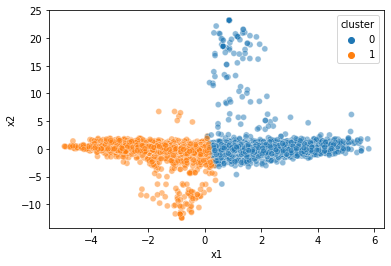

In [ ]:
PCA_df = pd.DataFrame(pca_result)
PCA_df['cluster'] = clustered
PCA_df.columns = ['x1','x2','cluster']
k_means_figure = sns.scatterplot(data=PCA_df,x='x1',y='x2',hue='cluster',legend="full",alpha=0.5)
figure = k_means_figure.get_figure()
figure.savefig('fake_news_K_Means_Cluster_figure')
import matplotlib.pyplot as plt
plt.show()

In [ ]:
# Creating dictionary of classifier and their parameters

dict_classifier = {'LogRegress':LogisticRegression,'KNN':KNeighborsClassifier,'SVC':SVC,'NB':GaussianNB,'DT':DecisionTreeClassifier,'RF':RandomForestClassifier}

parameters = {
    'LogRegress':{'random_state':[0],'solver':['sag'],'max_iter':[100],'n_jobs':[-1]},
    'KNN':{'n_neighbors':[5,10,15],'p':[2],'metric':['minkowski'],'n_jobs':[-1]},
    'SVC':[{'C':[1,10,100,200,300],'random_state':[0],'gamma':['scale','auto',0.5,0.1,0.01,0.001,0.0001],'kernel':['rbf']},
           {'C':[1,10,100,200,300],'random_state':[0],'kernel':['linear']}],
    'DT':{'criterion':['gini','entropy'],'max_depth':[None,2,5,10,15],'min_samples_split':[2,3,4],'random_state':[0],'min_samples_leaf':[1,2,3]},
    'RF':{'n_estimators':[150,200,250],'criterion':['gini','entropy'],'max_depth':[5,10],'min_samples_split':[4,5],'random_state':[0],'min_samples_leaf':[2,3],'n_jobs':[-1]}
}

In [ ]:
# Testing of two of the classifier using GridSearchCV

grid_search = GridSearchCV(estimator = dict_classifier['SVC'](),param_grid = [parameters['SVC'][0]],scoring = 'accuracy',cv=10,n_jobs=-1)
grid_search.fit(pca_result,train_y)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
print("Best Accuracy will be: {:.2f} %".format(best_accuracy*100))
print("Best Parameters:", best_parameters)


grid_search = GridSearchCV(estimator = dict_classifier['LogRegress'](),param_grid = [parameters['LogRegress']],scoring = 'accuracy',cv=10,n_jobs=-1)
grid_search.fit(pca_result,train_y)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
print("Best Accuracy will be: {:.2f} %".format(best_accuracy*100))
print("Best Parameters:", best_parameters)

Best Accuracy will be: 99.98 %
Best Parameters: {'C': 100, 'gamma': 0.0001, 'kernel': 'rbf', 'random_state': 0}
Best Accuracy will be: 99.95 %
Best Parameters: {'max_iter': 100, 'n_jobs': -1, 'random_state': 0, 'solver': 'sag'}


/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [ ]:
# Creating a table of possible classifier, their parameters and their accuracies
import time as t
start = t.time()
classifier_model = {'Classifier':[],'Possible_Parameters':[],'Confusion_Matrix':[],'Best_Accuracy':[],'Best_Parameters':[]}
for key1,value1 in dict_classifier.items():
    if (key1!='NB') and (key1!='SVC'):
        parameter = {}
        for key2,value2 in parameters.items():
            if(key1==key2):
                parameter = value2.copy()
        grid_search = GridSearchCV(estimator = value1(),param_grid = parameter,scoring = 'accuracy',cv=10,n_jobs=-1)
        grid_search.fit(pca_result,train_y)
        best_accuracy = grid_search.best_score_
        best_parameters = grid_search.best_params_
        classifier = value1(**best_parameters)
        classifier.fit(pca_result,train_y)
        y_pred = classifier.predict(pca_result)
        cm = confusion_matrix(train_y,y_pred)
        classifier_model['Classifier'].append(key1)
        classifier_model['Possible_Parameters'].append(parameter)
        classifier_model['Confusion_Matrix'].append(cm)
        classifier_model['Best_Accuracy'].append(best_accuracy)
        classifier_model['Best_Parameters'].append(best_parameters)
        classifier_table = pd.DataFrame.from_dict(classifier_model)
    elif key1=='NB':
        classifier = value1()
        classifier.fit(pca_result,train_y)
        y_pred = classifier.predict(pca_result)
        cm = confusion_matrix(train_y,y_pred)
        classifier_model['Classifier'].append(key1)
        classifier_model['Possible_Parameters'].append('()')
        classifier_model['Confusion_Matrix'].append(cm)
        classifier_model['Best_Accuracy'].append(best_accuracy)
        classifier_model['Best_Parameters'].append('()')
    elif key1 == 'SVC':
        parameter_list = []
        for key2,value2 in parameters.items():
            if(key1==key2):
                parameter_list = value2.copy()
        grid_search = GridSearchCV(estimator = value1(),param_grid = parameter_list,scoring = 'accuracy',cv=10,n_jobs=-1)
        grid_search.fit(pca_result,train_y)
        best_accuracy = grid_search.best_score_
        best_parameters = grid_search.best_params_
        classifier = value1(**best_parameters)
        classifier.fit(pca_result,train_y)
        y_pred = classifier.predict(pca_result)
        cm = confusion_matrix(train_y,y_pred)
        classifier_model['Classifier'].append(key1)
        classifier_model['Possible_Parameters'].append(parameter)
        classifier_model['Confusion_Matrix'].append(cm)
        classifier_model['Best_Accuracy'].append(best_accuracy)
        classifier_model['Best_Parameters'].append(best_parameters)
    print('Classifier :',key1 )

classifier_table = pd.DataFrame.from_dict(classifier_model)
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(classifier_table)
print("Total time in seconds:",t.time() - start)

/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:352: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Classifier : LogRegress
Classifier : KNN


/usr/local/lib/python3.8/dist-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Classifier : SVC
Classifier : NB
Classifier : DT
Classifier : RF
   Classifier                                Possible_Parameters  \
0  LogRegress  {'random_state': [0], 'solver': ['sag'], 'max_...   
1         KNN  {'n_neighbors': [5, 10, 15], 'p': [2], 'metric...   
2         SVC  {'n_neighbors': [5, 10, 15], 'p': [2], 'metric...   
3          NB                                                 ()   
4          DT  {'criterion': ['gini', 'entropy'], 'max_depth'...   
5          RF  {'n_estimators': [150, 200, 250], 'criterion':...   

             Confusion_Matrix  Best_Accuracy  \
0      [[7032, 0], [8, 9332]]       0.999450   
1     [[7023, 9], [13, 9327]]       0.997984   
2      [[7031, 1], [3, 9337]]       0.999878   
3  [[6333, 699], [118, 9222]]       0.999878   
4      [[7032, 0], [0, 9340]]       0.999206   
5      [[7031, 1], [1, 9339]]       0.999450   

                                     Best_Parameters  
0  {'max_iter': 100, 'n_jobs': -1, 'random_state'...  
1  {'metric

In [ ]:
# From the table we find that SVC performs the best with 99.9 percent accuracy. So, we use SVC
# Prediction of category of news headlines in test data using Support Vector Classifier

classifier_svc = SVC(C=300,kernel='linear',random_state=0)
classifier_svc.fit(pca_result,train_y)

# testing time

import time as t

start_test = t.time()

tested_cluster = classifier_svc.predict(pca_result_test)
print(tested_cluster)

print("Total time in seconds:",t.time() - start_test)

[0 1 0 ... 1 1 0]
Total time in seconds: 0.0038390159606933594


In [ ]:
from sklearn.metrics import accuracy_score
print(accuracy_score(news_df_test['label'], tested_cluster))

0.8871243586611287


In [ ]:
# Creating a new test dataset with the predictions

trained_dataset_test_predict = news_df_test.copy()
trained_dataset_test_predict['predicted_cluster'] = tested_cluster

print(trained_dataset_test_predict.head())

                                                   title  \
20277  Oliver Stone: Pokémon Go is ‘Surveillance Capi...   
15250  BREAKING: OBAMA WILL VETO BILL Unanimously Pas...   
12262  The Real Reason Trump is Angry With McConnell ...   
1693   CBO says won't specify insurance impact of Rep...   
17183  [VIDEO] CARLY TAKES ON THE VIEW Hacks Only Day...   

                                                    text       subject  \
20277   Press Association The GuardianFilm director O...       US_News   
15250  This should come as a surprise to no one Yeste...      politics   
12262  Undercutting President Trump s agenda is what ...      politics   
1693   WASHINGTON (Reuters) - The U.S. Congressional ...  politicsNews   
17183  So, if the hosts on this show are just  comedi...      politics   

                      date      source  label  predicted_cluster  
20277        July 22, 2016         NaN      0                  0  
15250         Sep 12, 2016         NaN      0               

In [ ]:
# printing training dataset predictions.
print(news_df_predict.head())

                                                   title  \
11949  TRUMP BLASTS SENATE RINO ON TWITTER…Exposes RE...   
2737   U.S. health insurers want Cruz proposal droppe...   
11234  Ted Cruz did not disclose 2012 Senate campaign...   
19655   (VIDEO) OBAMA THROWS AMERICA UNDER THE BUS…AGAIN   
6523   Exclusive: Trump team seeks agency records on ...   

                                                    text          subject  \
11949  President Trump just exposed one of the bigges...         politics   
2737   WASHINGTON (Reuters) - Two major U.S. health i...     politicsNews   
11234  (Reuters) - Republican presidential candidate ...     politicsNews   
19655   I am a student of history so I tend to actual...  Government News   
6523    WASHINGTON (Reuters) - In a wide-ranging requ...     politicsNews   

                    date      source  label  Prediction  
11949        Oct 8, 2017         NaN      0           0  
2737      July 15, 2017    (Reuters)      1           1  
11

In [ ]:
news_df_predict.to_csv('fake_news_dataset_predict_on_text.csv')
trained_dataset_test_predict.to_csv('fake_news_dataset_test_predict_on_text.csv')

In [ ]:
# From the table we find that SVC performs the best with 99.9 percent accuracy. So, we use SVC
# Prediction of category of news headlines in test data using Support Vector Classifier

classifier_nb = GaussianNB()
classifier_nb.fit(pca_result,train_y)

# testing time

import time as t

start_test = t.time()

tested_cluster1 = classifier_nb.predict(pca_result_test)
print(tested_cluster1)

print("Total time in seconds:",t.time() - start_test)



from sklearn.metrics import accuracy_score
print(accuracy_score(news_df_test['label'], tested_cluster1))

[0 1 1 ... 1 1 1]
Total time in seconds: 0.0014019012451171875
0.8780845345712192
